
# Assignment 3

This is a template notebook for Assignment 3.


## Install dependencies and initialization

In [ ]:
# The next 8 lines added to be compatible with version changes (2022/10/13).
# change cuda to 11.1
import os
p = os.getenv('PATH')
ld = os.getenv('LD_LIBRARY_PATH')
os.environ['PATH'] = f"/usr/local/cuda-11.3/bin:{p}"
os.environ['LD_LIBRARY_PATH'] = f"/usr/local/cuda-11.3/lib64:{ld}"
# change pytorch to 1.9.0 compiled with cuda 11.1
%pip install torch==1.11.0+cu113 torchvision==0.12.0+cu113 torchaudio==0.11.0 --extra-index-url https://download.pytorch.org/whl/cu113


# install dependencies:
%pip install pyyaml pycocotools>=2.0.1
# !pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html
%pip install 'git+https://github.com/facebookresearch/detectron2.git'
%pip install -U fvcore

In [ ]:
!pwd # shows current directory
!ls  # shows all files in this directory
!nvidia-smi # shows the specs and the current status of the allocated GPU

In [3]:
# import some common libraries
from google.colab.patches import cv2_imshow
from sklearn.metrics import jaccard_score
from PIL import Image, ImageDraw
from tqdm.notebook import tqdm
import pandas as pd
import numpy as np
import datetime
import random
import json
import cv2
import csv
import os

# import some common pytorch utilities
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from torch.autograd import Variable
import torch.nn.functional as F
import torch.nn as nn
import torch

# import some common detectron2 utilities
import detectron2
from detectron2 import model_zoo
from detectron2.config import get_cfg
from detectron2.structures import BoxMode
from detectron2.engine import DefaultTrainer
from detectron2.engine import DefaultPredictor
from detectron2.utils.logger import setup_logger
from detectron2.utils.visualizer import ColorMode
from detectron2.utils.visualizer import Visualizer
from detectron2.data import build_detection_test_loader
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

from detectron2.data import detection_utils as utils
import detectron2.data.transforms as T
setup_logger()

<Logger detectron2 (DEBUG)>

In [4]:
# Make sure that GPU is available for your notebook.
# Otherwise, you need to update the settungs in Runtime -> Change runtime type -> Hardware accelerator
torch.cuda.is_available()

True

In [5]:
# You need to mount your google drive in order to load the data:
from google.colab import drive
drive.mount('/content/drive')

os.chdir("/content/drive/My Drive/CMPT_CV_lab3/")

# Put all the corresponding data files in a data folder and put the data folder in a same directory with this notebook.
# Also create an output directory for your files such as the trained models and the output images.

Mounted at /content/drive


In [6]:
# Define the location of current directory, which should contain data/train, data/test, and data/train.json.
# TODO: approx 1 line
BASE_DIR = ''
OUTPUT_DIR = '{}/output'.format(BASE_DIR)
#os.makedirs(OUTPUT_DIR, exist_ok=True)

## Part 1: Object Detection

### Data Loader

In [7]:
from tqdm import tqdm
from os import listdir
from os.path import isfile, join

# global data_dicts so that the get_detection_data function doesn't have to go through the files every time
train_data_dict_global = []
val_data_dict_global = []
test_data_dict_global = []

train_files = [] # file name of files that are used for training (and not validation)

num_of_data_samples = 198 # according to the project handout
def get_detection_data(set_name, reuse_previous = True):
  #data_dirs = '{}/data'.format(BASE_DIR)
  global train_data_dict_global
  global val_data_dict_global
  global test_data_dict_global
  global train_files
  data_dirs = 'data'
  dataset = []
  dataset_dicts = []
  if set_name in ['train', 'val']:
    json_file = os.path.join(data_dirs, "train.json")
    with open(json_file) as f:
        imgs_anns = json.load(f)
    if set_name == 'train':
      if reuse_previous == True and train_data_dict_global is not None:
        return train_data_dict_global
      begin_index = 0
      end_index = int(0.8 * len(imgs_anns))
    else:
      if reuse_previous == True and val_data_dict_global is not None:
        return val_data_dict_global
      begin_index= int(0.8 * len(imgs_anns))
      end_index = len(imgs_anns)

    annotation_per_file = {} # keys: file_name , values: annotations of the filename, collected from different jsons
    for idx, v in enumerate(tqdm(imgs_anns)):
      record = {}

      # dict_keys(['id', 'image_id', 'segmentation', 'category_id', 'category_name', 'iscrowd', 'area', 'bbox', 'file_name']
      filename = os.path.join(BASE_DIR, 'data/train/', v["file_name"])

      file_already_added_to_train = filename in train_files
      if set_name == 'train' and len(train_files) >= int(num_of_data_samples * 0.8) and not file_already_added_to_train:
        continue

      if set_name == 'val' and file_already_added_to_train:
        continue

      if filename not in annotation_per_file.keys():
        if set_name == 'train':
          train_files.append(filename)
        height, width = cv2.imread(filename).shape[:2] # H * W * 3
        record["file_name"] = filename
        record["image_id"] = v['image_id']
        record["height"] = height
        record["width"] = width
        record['annotations'] = []
        annotation_per_file[filename] = record

      instance_annotations = {}
      instance_annotations['bbox'] = v['bbox']
      instance_annotations['bbox_mode'] = BoxMode.XYWH_ABS # (x0, y0, w, h) in absolute floating points coordinates.
      instance_annotations['iscrowd'] = v['iscrowd']
      instance_annotations['category_id'] = 0
      instance_annotations['segmentation'] = v['segmentation']

      annotation_per_file[filename]['annotations'].append(instance_annotations)
    dataset_dicts = list(annotation_per_file.values())
    if set_name == 'train':
      train_data_dict_global = dataset_dicts
    else:
      val_data_dict_global = dataset_dicts
  else:
    if reuse_previous == True and test_data_dict_global is not None:
        return test_data_dict_global
    test_path = os.path.join(BASE_DIR, 'data/test/')
    onlyfiles = [f for f in listdir(test_path) if isfile(join(test_path, f))]

    for idx, test_file in enumerate(tqdm(onlyfiles)):

      filename = os.path.join(BASE_DIR, test_path, test_file)
      record = {}
      height, width = cv2.imread(filename).shape[:2]

      record["file_name"] = test_file
      record["image_id"] = int(test_file[1:-4]) # removing the P and .png
      record["height"] = height
      record["width"] = width
      record['annotations'] = [] # no annotations for test

      dataset_dicts.append(record)

    test_data_dict_global = dataset_dicts


  return dataset_dicts

print(len(get_detection_data('train', reuse_previous = False))) # 150
print(len(get_detection_data('val', reuse_previous= False))) # 40
print(len(get_detection_data('test', reuse_previous= False))) # 72

100%|██████████| 7980/7980 [03:26<00:00, 38.64it/s]


158


100%|██████████| 7980/7980 [00:42<00:00, 188.02it/s]


40


100%|██████████| 72/72 [01:25<00:00,  1.18s/it]

72


In [8]:
for d in ["train", "val", "test"]:
    DatasetCatalog.register("data_detection_" + d, lambda d=d: get_detection_data(d))
    MetadataCatalog.get("data_detection_" + d).set(thing_classes=["plane"])




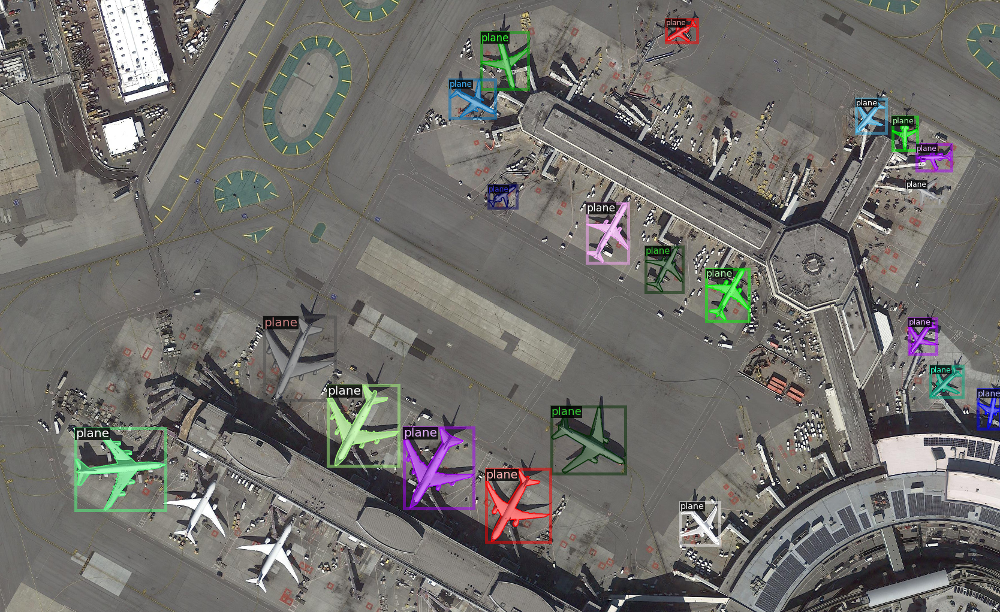

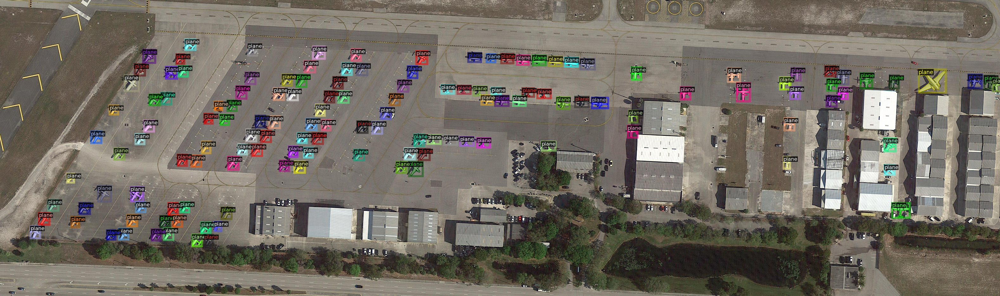

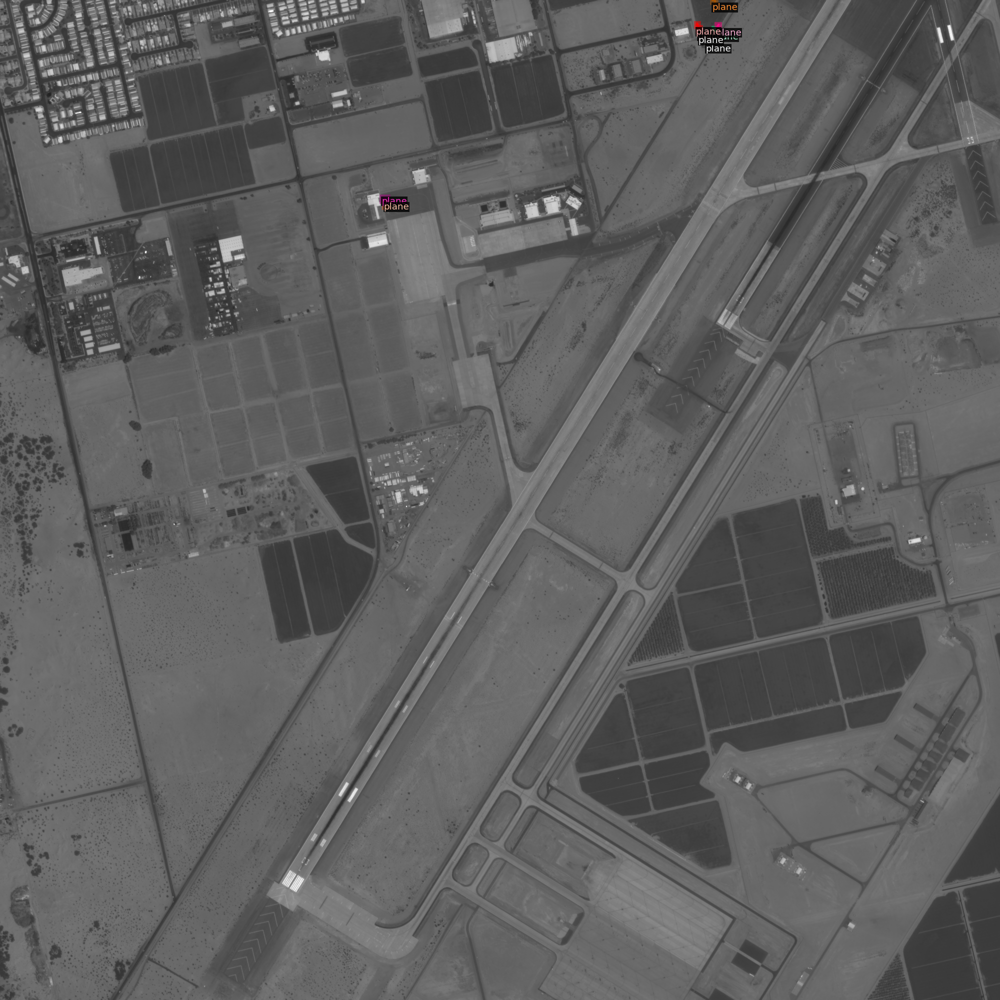

In [ ]:
dataset_dicts = get_detection_data('train')
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=MetadataCatalog.get("data_detection_train"), scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

### Set Configs

In [9]:
cfg = get_cfg()
cfg.OUTPUT_DIR = "{}/output/".format(BASE_DIR)
cfg = get_cfg()
# cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml"))
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("data_detection_train",)
cfg.DATASETS.TEST = () # TODO: add validation loader somehow here
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")
#cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2  # This is the real "batch size" commonly known to deep learning people

cfg.SOLVER.BASE_LR = 0.002  # pick a good LR
cfg.SOLVER.MAX_ITER = 2000  # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.SOLVER.CHECKPOINT_PERIOD = 750
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256   # The "RoIHead batch size". 128 is faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (Plane).
cfg.SOLVER.LR_SCHEDULER_NAME = "WarmupCosineLR"
cfg.SOLVER.WARMUP_ITERS = int(0.2*cfg.SOLVER.MAX_ITER)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

#additional params


#cfg.TEST.EVAL_PERIOD =  100
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.60

### Training

####Training Phase

In [ ]:
from detectron2.data import DatasetMapper
from detectron2.data import build_detection_train_loader
import copy
# defining trainer that supports validation
def custom_mapper(dataset_dict):
    dataset_dict = copy.deepcopy(dataset_dict)  # it will be modified by code below
    file_name = os.path.join(BASE_DIR, 'data/train/', dataset_dict["file_name"])
    #image = utils.read_image(dataset_dict["file_name"], format="BGR")
    image = cv2.imread(file_name)
    transform_list = [
        T.Resize((800,600)),
        T.RandomBrightness(0.8, 1.8),
        T.RandomContrast(0.6, 1.3),
        T.RandomSaturation(0.8, 1.4),
        T.RandomRotation(angle=[90, 90]),
        T.RandomLighting(0.7),
        T.RandomFlip(prob=0.4, horizontal=False, vertical=True),
    ]
    image, transforms = T.apply_transform_gens(transform_list, image)
    dataset_dict["image"] = torch.as_tensor(image.transpose(2, 0, 1).astype("float32"))

    annos = [
        utils.transform_instance_annotations(obj, transforms, image.shape[:2])
        for obj in dataset_dict.pop("annotations")
        if obj.get("iscrowd", 0) == 0
    ]
    instances = utils.annotations_to_instances(annos, image.shape[:2])
    dataset_dict["instances"] = utils.filter_empty_instances(instances)
    return dataset_dict



class Customized_Trainer(DefaultTrainer):

    @classmethod
    def build_train_loader(cls, cfg):
        mapper_train = DatasetMapper(cfg,
                       is_train=True,
                       augmentations=[ #Apply a sequence of augmentations.
                                      T.Resize((800,600)),
                                      T.RandomBrightness(0.8, 1.8),
                                      T.RandomContrast(0.6, 1.3),
                                      T.RandomSaturation(0.8, 1.4),
                                      T.RandomRotation(angle=[90, 90]),
                                      T.RandomLighting(0.7),
                                      T.RandomFlip(prob=0.4, horizontal=False, vertical=True),
                                      # T.Resize((800,600)),
                                      # T.RandomFlip(prob=0.5, horizontal=False, vertical=True),
                                      # T.RandomFlip(prob=0.5, horizontal=True, vertical=False),
                                      # T.RandomRotation(angle=[0, 90, 180, 270], sample_style="choice"),
                                      # T.RandomApply(T.RandomBrightness(0.9, 1.1), prob=0.5),
                                      # T.RandomApply(T.RandomContrast(0.9, 1.1), prob=0.5),
                                      # T.RandomApply(T.RandomSaturation(0.9, 1.1), prob=0.5),
                                      # T.RandomApply(T.RandomLighting(0.9), prob=0.5),


                                      ]
                       )
        return build_detection_train_loader(cfg, mapper=mapper_train)
        #return build_detection_train_loader(cfg, mapper= custom_mapper)

trainer = DefaultTrainer(cfg)
#os.makedirs(OUTPUT_DIR, exist_ok=True)
#resume_dir = os.getcwd()+'/output/' # get the last resume checkpoint file path
#trainer = Customized_Trainer(cfg)
trainer.resume_or_load(resume = False)
trainer.train()



%load_ext tensorboard
%tensorboard --logdir output
%tensorboard --logdir /content/drive/MyDrive/CMPT_CV_lab3/output --port 6008

### Evaluation and Visualization

In [11]:
'''
# After training the model, you need to update cfg.MODEL.WEIGHTS
# Define a DefaultPredictor
'''

#%tensorboard --logdir /content/drive/MyDrive/CMPT_CV_lab3/output --port 6008
# Saving the model in case checkpoint doesn't work
#torch.save(trainer.model.state_dict(), os.path.join(cfg.OUTPUT_DIR, "detection_model.pth"))

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.6   # according to the doc
predictor = DefaultPredictor(cfg)
#apparently each box is in format of (x1, y1, x2, y2)


[11/12 21:29:40 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


In [ ]:
'''
# Visualize the output for 3 random test samples
# TODO: approx 10 lines
'''

from detectron2.utils.visualizer import ColorMode
dataset_dicts = get_detection_data("test")
for d in random.sample(dataset_dicts, 3):
    im = cv2.imread(os.path.join('data/test/', d["file_name"]))
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata= MetadataCatalog.get("data_detection_test"),
                   scale=0.5,
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
'''
# Use COCOEvaluator and build_detection_train_loader
# You can save the output predictions using inference_on_dataset
# TODO: approx 5 lines
'''
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("data_detection_val", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "data_detection_val")
print(inference_on_dataset(predictor.model, val_loader, evaluator))


### Improvements

For this part, you can bring any improvement which you have by adding new input parameters to the previous functions or defining new functions and variables.

In [ ]:
'''
# Bring any changes and updates regarding the improvement in here
'''


## Part 2: Semantic Segmentation

### Data Loader

In [ ]:
'''
# Write a function that returns the cropped image and corresponding mask regarding the target bounding box
# idx is the index of the target bbox in the data
# high-resolution image could be passed or could be load from data['file_name']
# You can use the mask attribute of detectron2.utils.visualizer.GenericMask
#     to convert the segmentation annotations to binary masks
# TODO: approx 10 lines
'''
from detectron2.utils.visualizer import GenericMask

# def get_instance_sample(data, idx, img=None):
#   if img is None:
#     filename = data["file_name"]
#     img = cv2.imread(filename) # probably H * W * C
#     height, width = img.shape[:2]


#   bbox = data['annotations'][idx]['bbox']
#   x0, y0, w, h = int(bbox[0]), int(bbox[1]), int(bbox[2]), int(bbox[3])
#   # print(img.shape)
#   # print(x0,' ', y0,' ', w, ' ', h)
#   obj_img = img[y0: y0 + h, x0: x0 + w, :] # note that x-y are the opposite of row-column!

#   segmentation_mask = data['annotations'][idx]['segmentation'] # in form of [x1, y1, x2, y2, ...]
#   # we want to convert the mask to binary (true, false mask)

#   generic_mask = GenericMask(mask_or_polygons = segmentation_mask, height = height, width = width)

#   obj_mask = generic_mask.mask # GenericMask has a property function for mask (simillar to a getter) that converts our given polygons (i.e., [x1,y1,x2,y2,...]) to binary mask



#   return obj_img, obj_mask[y0: y0 + h, x0: x0 + w]
import gc
import copy

def get_all_instances_of_image(data):

  filename = data["file_name"]
  img = cv2.imread(filename) # probably H * W * C
  height, width = img.shape[:2]
  instances = [] # list of tuples
  for idx in range(len(data['annotations'])):
    annotation = data['annotations'][idx]
    bbox = annotation['bbox']
    x0, y0, w, h = int(bbox[0]), int(bbox[1]), int(bbox[2]), int(bbox[3])

    obj_img = img[y0: y0 + h, x0: x0 + w, :] # note that x-y are the opposite of row-column!

    #annotation['segmentation'] is in form of [x1, y1, x2, y2, ...]
   # we want to convert the mask to binary (true, false mask)

    obj_mask = GenericMask(mask_or_polygons = annotation['segmentation'], height = height, width = width).mask[y0: y0 + h, x0: x0 + w]

    obj_img = cv2.resize(obj_img, (128, 128), interpolation=cv2.INTER_AREA)
    obj_mask = cv2.resize(obj_mask, (128, 128), interpolation=cv2.INTER_AREA)

    instances.append([obj_img, obj_mask])
  return instances

def get_all_instances(dataset):
  obj_instances = []
  for data in tqdm(dataset):
    obj_instances += get_all_instances_of_image(data)
  return obj_instances



# Now you can call get_instance_sample with your dataset and it will return two separate lists

# Now you can call get_instance_sample with your dataset
# m = get_detection_data('train.json')

#images, masks = get_instance_sample(get_detection_data('train'))




train_data_list = DatasetCatalog.get("data_detection_{}".format('train'))
train_data_samples = get_all_instances(train_data_list)
#my_data_list += DatasetCatalog.get("data_detection_{}".format('val'))
# for idx, data_dict in enumerate(tqdm(train_data_list)):
#   all_data_samples.append(get_all_instances_of_image(data_dict))


val_data_list = DatasetCatalog.get("data_detection_{}".format('val'))
val_data_samples = get_all_instances(val_data_list)
#my_data_list += DatasetCatalog.get("data_detection_{}".format('val'))
# for idx, data_dict in enumerate(tqdm(val_data_list)):
#   all_data_samples[data_dict['file_name']] = get_all_instances_of_image(data_dict)


100%|██████████| 40/40 [00:30<00:00,  1.32it/s]


In [ ]:
'''
# We have provided a template data loader for your segmentation training
# You need to complete the __getitem__() function before running the code
# You may also need to add data augmentation or normalization in here
'''

class PlaneDataset(Dataset):
  def __init__(self, set_name, data_list):
      self.transforms = transforms.Compose([
          transforms.ToTensor(), # Converting the image to tensor and change the image format (Channels-Last => Channels-First)
          # transforms.RandomHorizontalFlip(),
          # transforms.RandomVerticalFlip(),
      ])
      self.set_name = set_name
      self.data = data_list
      self.instance_map = []
      for i, d in enumerate(self.data):
        for j in range(len(d['annotations'])):
          self.instance_map.append([i,j])

  '''
  # you can change the value of length to a small number like 10 for debugging of your training procedure and overfeating
  # make sure to use the correct length for the final training
  '''
  def __len__(self):
      return len(self.instance_map)

  def numpy_to_tensor(self, img, mask):
    if self.transforms is not None:
        img = self.transforms(img)
    img = torch.tensor(img, dtype=torch.float)
    mask = torch.tensor(mask, dtype=torch.float)
    return img, mask

  '''
  # Complete this part by using get_instance_sample function
  # make sure to resize the img and mask to a fixed size (for example 128*128)
  # you can use "interpolate" function of pytorch or "numpy.resize"
  # TODO: 5 lines
  '''
  def __getitem__(self, idx):
    if torch.is_tensor(idx):
        idx = idx.tolist()
    #idx = self.instance_map[idx]
    #data = self.data[idx[0]]

    # file_idx, annotation_idx = self.instance_map[idx]
    # data = self.data[file_idx] # the dict corresponding to our desired file
    #obj_img, obj_mask = get_instance_sample(data, annotation_idx)
    #obj_img, obj_mask = all_data_samples[data['file_name']][annotation_idx]
    if self.set_name == 'train':
      img, mask = train_data_samples[idx]
    else:
      img, mask = val_data_samples[idx]

    #img = torch.ao.nn.quantized.functional.interpolate(input = obj_img, size = [128, 128, 3])
    # img = cv2.resize(obj_img, (128, 128)) # I think we don't need to convert it to (128, 128, 3) since cv2 will handle this
    # mask = cv2.resize(obj_mask, (128,128))
    img, mask = self.numpy_to_tensor(img, mask)
    mask = torch.unsqueeze(mask,0) #why?
    return img, mask

def get_plane_dataset(set_name='train', batch_size=2):
    my_data_list = DatasetCatalog.get("data_detection_{}".format(set_name))
    dataset = PlaneDataset(set_name, my_data_list)
    loader = DataLoader(dataset, batch_size=batch_size, num_workers=4,
                                              pin_memory=True, shuffle=True)
    return loader, dataset

### Network

In [ ]:
'''
# convolution module as a template layer consists of conv2d layer, batch normalization, and relu activation
'''
class conv(nn.Module):
    def __init__(self, in_ch, out_ch, activation=True):
        super(conv, self).__init__()
        if(activation):
          self.layer = nn.Sequential(
             nn.Conv2d(in_ch, out_ch, 3, padding=1),
             nn.BatchNorm2d(out_ch),
             nn.ReLU(inplace=True)
             # dropout?
          )
        else:
          self.layer = nn.Sequential(
             nn.Conv2d(in_ch, out_ch, 3, padding=1)
             )

    def forward(self, x):
        x = self.layer(x)
        return x

'''
# downsampling module equal to a conv module followed by a max-pool layer
'''
class down(nn.Module):
    def __init__(self, in_ch, out_ch):
        super(down, self).__init__()
        self.layer = nn.Sequential(
            nn.MaxPool2d(2),
            conv(in_ch, out_ch)
            )

    def forward(self, x):
        x = self.layer(x)
        return x

'''
# upsampling module equal to a upsample function followed by a conv module
'''
class up(nn.Module):
    def __init__(self, in_ch, out_ch, bilinear=False):
        super(up, self).__init__()
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        else:
            self.up = nn.ConvTranspose2d(in_ch, out_ch, 2, stride=2)

    def forward(self, x, c = None):
        y = self.up(x)
        return y

'''
# the main model which you need to complete by using above modules.
# you can also modify the above modules in order to improve your results.
'''
class MyModel(nn.Module):
    def __init__(self, with_skip_connection = True, dropout = 0.1):
        super(MyModel, self).__init__()

        self.with_skip_connection = with_skip_connection
        # Encoder

        # self.input_conv = conv(3, 4)
        # self.down = down(4, 8)
        self.c1 = conv(3,16)
        self.c2 = down(16,32)
        self.c3 = down(32,64)
        self.c4 = down(64,128)
        self.c5 = down(128,256)
        self.c6 = down(256,512)
        self.dropout = dropout




        # Decoder

        self.u6 = up(512,256)
        self.u7 = up(256,128)
        self.u8 = up(128,64)
        self.u9 = up(64,32)
        self.u10 = up(32,16)
        if self.with_skip_connection:
          self.c7 =conv(512,256)
          self.c8 = conv(256,128)
          self.c9 = conv(128,64)
          self.c10 = conv(64,32)
          self.c11 = conv(32,16)





        self.output_conv = conv(16, 1, False) # ReLu activation is removed to keep the logits for the loss function


    def forward(self, input):
      # y = self.input_conv(input)
      # y = self.down(y)
      # y = self.up(y)
      # output = self.output_conv(y)


      # encoder part

      output_1 = self.c1(input)
      output_1 = nn.Dropout(self.dropout)(output_1)

      output_2 = self.c2(output_1)
      output_2 = nn.Dropout(self.dropout)(output_2)

      output_3 = self.c3(output_2)
      output_3 = nn.Dropout(self.dropout)(output_3)

      output_4 = self.c4(output_3)
      output_4 = nn.Dropout(self.dropout)(output_4)


      output_5 = self.c5(output_4)
      output_5 = nn.Dropout(self.dropout)(output_5)


      output_6 = self.c6(output_5)
      output_6 = nn.Dropout(self.dropout)(output_6)





      # decoder part
      output_dec = self.u6(output_6)
      if self.with_skip_connection:
        output_dec = torch.cat((output_dec, output_5), 1)
        output_dec = nn.Dropout(self.dropout)(output_dec)
        output_dec = self.c7(output_dec)

      output_dec = self.u7(output_dec)
      if self.with_skip_connection:
        output_dec = torch.cat((output_dec, output_4), 1)
        output_dec = nn.Dropout(self.dropout)(output_dec)
        output_dec = self.c8(output_dec)

      output_dec = self.u8(output_dec)
      if self.with_skip_connection:
        output_dec = torch.cat((output_dec, output_3), 1)
        output_dec = nn.Dropout(self.dropout)(output_dec)
        output_dec = self.c9(output_dec)

      output_dec = self.u9(output_dec)
      if self.with_skip_connection:
        output_dec = torch.cat((output_dec, output_2), 1)
        output_dec = nn.Dropout(self.dropout)(output_dec)
        output_dec = self.c10(output_dec)

      output_dec = self.u10(output_dec)
      if self.with_skip_connection:
        output_dec = torch.cat((output_dec, output_1), 1)
        output_dec = nn.Dropout(self.dropout)(output_dec)
        output_dec = self.c11(output_dec)
      output_dec = self.output_conv(output_dec)



      return nn.Sigmoid()(output_dec)


### Training

In [ ]:
# functions for calculating mean IOU on validation set



import copy
def compute_overall_iou(model, loader):

  model_copy = copy.deepcopy(model)
  number_of_images = 0
  total_iou = 0
  for (img, mask) in tqdm(loader):
    with torch.no_grad():
      img = img.cuda() # B * C * W * H
      mask = mask.cuda() # B * 1 * W * H
      # mask = torch.unsqueeze(mask,1)
      pred = model_copy(img)# B * 1 * W * H
      number_of_images += batch_size
      total_iou += compute_iou(pred,mask)
    '''
    ## Complete the code by obtaining the IoU for each img and print the final Mean IoU
    '''
  return number_of_images, total_iou/number_of_images


def compute_iou(pred, mask, threshold = 0.5):
  pred = pred.detach().cpu().numpy()
  mask = mask.detach().cpu().numpy()
  pred = (pred >= threshold)
  mask_boolean = (mask>= threshold)

  intersect = (pred & mask_boolean)
  union = (pred | mask_boolean)

  return (intersect.sum()/union.sum())



In [ ]:
'''
# The following is a basic training procedure to train the network
# You need to update the code to get the best performance
# TODO: approx ? lines
'''
from torch.optim.lr_scheduler import ReduceLROnPlateau, StepLR

# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


class DiceLoss(nn.Module):
    def __init__(self, smooth=1.):
        super(DiceLoss, self).__init__()
        self.smooth = smooth

    def forward(self, logits, true):
        #probs = torch.sigmoid(logits)
        probs = logits
        m1 = probs.view(-1)
        m2 = true.view(-1)
        intersection = (m1 * m2).sum()
        dice_coeff = (2. * intersection + self.smooth) / (m1.sum() + m2.sum() + self.smooth)
        return 1 - dice_coeff

class FocalLoss(nn.Module):
    def __init__(self, alpha=0.8, gamma=2.):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma

    def forward(self, inputs, targets):
        BCE_loss = F.binary_cross_entropy(inputs, targets, reduction='none')
        pt = torch.exp(-BCE_loss)
        F_loss = self.alpha * (1-pt)**self.gamma * BCE_loss
        return F_loss.mean()

class CombinedLoss(nn.Module):
    def __init__(self, weight_dice=0.5, weight_focal=0.5):
        super(CombinedLoss, self).__init__()
        self.weight_dice = weight_dice
        self.weight_focal = weight_focal
        self.dice_loss = DiceLoss()
        self.focal_loss = FocalLoss()

    def forward(self, logits, true):
        dice = self.dice_loss(logits, true)
        focal = self.focal_loss(logits, true)
        return self.weight_dice * dice + self.weight_focal * focal

class TverskyLoss(nn.Module):
  def __init__(self, alpha = 0.5, beta = 0.5):
    super(TverskyLoss, self).__init__()
    self.alpha = alpha
    self.beta = beta
  def tversky_index(self, y_true, y_pred):
    # generalization of dice coefficient algorithm
    #   alpha corresponds to emphasis on False Positives
    #   beta corresponds to emphasis on False Negatives (our focus)
    #   if alpha = beta = 0.5, then same as dice
    #   if alpha = beta = 1.0, then same as IoU/Jaccard

    y_true_f = torch.flatten(y_true)
    y_pred_f = torch.flatten(y_pred)
    intersection = (y_true_f * y_pred_f).sum()
    return (intersection) / (intersection + self.alpha * ((y_pred_f*(1. - y_true_f)).sum()) + self.beta *  (((1-y_pred_f)*y_true_f).sum()))

  def tversky_index_loss(self, y_true, y_pred):
    return -1 * self.tversky_index(y_true, y_pred)

  def forward(self, pred, true):
    return self.tversky_index_loss(true, pred)
# Set the hyperparameters
num_epochs = 100
batch_size = 16 #4
learning_rate = 0.01
#weight_decay = 1e-8

model = MyModel() # initialize the model
model = model.cuda() # move the model to GPU
loader, _ = get_plane_dataset('train', batch_size) # initialize data_loader
#crit = nn.BCEWithLogitsLoss() # Define the loss function
#crit = nn.BCELoss()

crit = CombinedLoss(weight_dice=0.5, weight_focal=0.5) # Use the combined loss function
#crit =  FocalLoss()
#crit = TverskyLoss(alpha = 0.8, beta = 0.8)
optim = torch.optim.Adam(model.parameters(), lr=learning_rate) # Initialize the optimizer as SGD

scheduler = ReduceLROnPlateau(optim, mode='min', factor=0.1, patience=3, verbose=True)
#scheduler = StepLR(optim, step_size=15, gamma=0.1)#
validation_ious = []
training_losses = []
val_loader, val_dataset = get_plane_dataset('val', 1)

# start the training procedure
for epoch in range(num_epochs):
  total_loss = 0
  for (img, mask) in tqdm(loader):
    img = torch.tensor(img, device=torch.device('cuda'), requires_grad = True)
    mask = torch.tensor(mask, device=torch.device('cuda'), requires_grad = True)
    pred = model(img)
    loss = crit(pred, mask)
    optim.zero_grad()
    loss.backward()
    optim.step()
    total_loss += loss.cpu().data
  epoch_loss = total_loss / len(loader)
  training_losses.append(epoch_loss)
  print("Epoch: {}, Loss: {}".format(epoch, epoch_loss))
  #number_of_images, mean_iou = compute_overall_iou(model, val_loader)
  #validation_ious.append(mean_iou)
  #print("Epoch: {}, IOU: {}".format(epoch, mean_iou))
  #torch.save(model.state_dict(), 'output/{}_segmentation_model.pth'.format(BASE_DIR, epoch))
  scheduler.step(epoch_loss)
  #scheduler.step()
  print('current lr: ', optim.param_groups[-1]['lr'])
'''
# Saving the final model
'''
torch.save(model.state_dict(), 'output/final_segmentation_model.pth')
print('model saved!')


### Evaluation and Visualization


In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(14,5))
plt.title("Training Loss")
#plt.plot(validation_ious,label="Val IoU")
plt.plot(training_losses,label="train loss")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

In [ ]:
'''
# Before starting the evaluation, you need to set the model mode to eval
# You may load the trained model again, in case if you want to continue your code later
# TODO: approx 15 lines
'''
import copy

batch_size = 1
model = MyModel().cuda()
#model.load_state_dict(torch.load('output/final_segmentation_model.pth'.format(BASE_DIR)))
model.load_state_dict(torch.load('output/final_segmentation_model.pth'))
model = model.eval() # chaning the model to evaluation mode will fix the bachnorm layers
loader, dataset = get_plane_dataset('val', batch_size)
number_of_images, mean_iou = compute_overall_iou(model, loader)

print("\n #images: {}, Mean IoU: {}".format( number_of_images, mean_iou))

In [ ]:
'''
# Visualize 3 sample outputs
# TODO: approx 5 lines
'''
import matplotlib.pyplot as plt
model = MyModel().cuda()
#model.load_state_dict(torch.load('output/final_segmentation_model.pth'.format(BASE_DIR)))
model.load_state_dict(torch.load('output/final_segmentation_model.pth'))
model = model.eval() # chaning the model to evaluation mode will fix the bachnorm layers
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
im = [4]
bboxes = [[300,50,450,200], [880, 1000, 1150, 1400], [400,200, 750, 600]]
file_names = ['P0173.png','P0217.png', 'P1133.png']

transform = transforms.Compose([
        transforms.ToTensor(),
    ])



for idx,file in enumerate(file_names):
  file_name = os.path.join(BASE_DIR, 'data/test/', file)
  x0, y0, x1, y1 = bboxes[idx]
  img = cv2.imread(file_name)[x0: x1, y0 : y1]
  org_img = cv2.imread(file_name)[x0: x1, y0 : y1]
  img = cv2.resize(img, (128, 128), interpolation=cv2.INTER_AREA)
  # img = np.expand_dims(img, 0)
  # print(img.shape)
  # img= torch.tensor(img)
  img = transform(img).unsqueeze(0).to(device)
  with torch.no_grad():
  # img, gt_mask, pred_mask = get_prediction_mask(test_data_list[im[i]])
    pred_mask = model(img)
  plt.figure(figsize=(15,15))
  plt.subplot(idx + 1, 2, 1)
  plt.imshow(org_img)
  plt.subplot(idx + 1, 2, 2)
  pred_img = pred_mask.detach().cpu().numpy().squeeze()


  plt.imshow(pred_img)

## Part 3: Instance Segmentation

In this part, you need to obtain the instance segmentation results for the test data by using the trained segmentation model in the previous part and the detection model in Part 1.

### Get Prediction

In [ ]:
'''
# Define a new function to obtain the prediction mask by passing a sample data
# For this part, you need to use all the previous parts (predictor, get_instance_sample, data preprocessings, etc)
# It is better to keep everything (as well as the output of this funcion) on gpu as tensors to speed up the operations.
# pred_mask is the instance segmentation result and should have different values for different planes.
# TODO: approx 35 lines
'''
model = MyModel().cuda()
#model.load_state_dict(torch.load('output/final_segmentation_model.pth'.format(BASE_DIR)))
model.load_state_dict(torch.load('output/_segmentation_model.pth'))
model = model.eval() # chaning the model to evaluation mode will fix the bachnorm layers

def get_prediction_mask(data):

  filename = data["file_name"]

  img = cv2.imread(filename)
  img_height = img.shape[0]
  img_width = img.shape[1]

  gt_mask = np.zeros([img_height, img_width])
  pred_mask = np.zeros([img_height, img_width])

  # predicted masks
  outputs = predictor(img)
  number_of_predictions = len(outputs['instances'])
  initial_color = 255 // number_of_predictions

  for i, prediction in outputs['instances']:
    bbox = np.array(np.floor(list(prediction._fields['pred_boxes'])[0].cpu().numpy()), dtype=np.uint32) # Getting the bounding boxes
    y1, x1, y2, x2 = bbox
    to_be_masked = img[x1:x2, y1:y2]
    to_be_masked = cv2.resize(to_be_masked, (128, 128), interpolation = cv2.INTER_AREA) # Resizing to make sure it matches our expected
    prediction_from_mask = model(torch.unsqueeze(torch.tensor(transforms.ToTensor()(to_be_masked), device=torch.device('cuda')),0)).cpu().detach().numpy()[0] # Getting a mask prediction from my trained model
    prediction_from_mask = cv2.resize(prediction_from_mask[0], (y2-y1, x2-x1), interpolation = cv2.INTER_AREA) # Reshaping to the original shape
    prediction_from_mask = pred = (prediction_from_mask >= 0.5) * (initial_color * (idx + 1))
    predicted_mask = pred_mask[x1:x2, y1:y2]
    predicted_mask[predicted_mask==0] = 10000
    overlapping = np.minimum(predicted_mask,prediction_from_mask)
    overlapping[overlapping == 1000] = 0
    pred_mask[x1:x2, y1:y2] = overlapping # set the masking of the location



  # ground truth
  if len(data['annotations']) > 0 : # data is train/val data and has annotation
    #we will distrubute the colors (0-255) evenly between the planes in this image
    number_of_boxes = len(data['annotations'])
    initial_color = 255 // number_of_boxes
    for idx,annotation in enumerate(data['annotations']):
      obj_img, obj_mask = get_instance_sample(data, idx)
      bbox = data['annotations'][idx]['bbox']
      x0, y0, w, h = int(bbox[0]), int(bbox[1]), int(bbox[2]), int(bbox[3])


      gt_mask[y0: y0 + h, x0: x0 + w] = np.maximum(gt_mask[y0: y0 + h, x0: x0 + w], obj_mask * (initial_color * (idx + 1)))



  return img, gt_mask, pred_mask # gt_mask could be all zero when the ground truth is not given.


[[0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]]


### Visualization and Submission

In [ ]:
'''
# Visualise the output prediction as well as the GT Mask and Input image for a sample input
# TODO: approx 10 lines
'''
from detectron2.utils.visualizer import ColorMode
dataset_dicts = get_detection_data("test")
for d in random.sample(dataset_dicts, 3):
    im = cv2.imread(os.path.join('data/test/', d["file_name"]))
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata= MetadataCatalog.get("data_detection_test"),
                   scale=0.5,
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])


In [ ]:
'''
# ref: https://www.kaggle.com/rakhlin/fast-run-length-encoding-python
# https://www.kaggle.com/c/airbus-ship-detection/overview/evaluation
'''
def rle_encoding(x):
    '''
    x: pytorch tensor on gpu, 1 - mask, 0 - background
    Returns run length as list
    '''
    dots = torch.where(torch.flatten(x.long())==1)[0]
    if(len(dots)==0):
      return []
    inds = torch.where(dots[1:]!=dots[:-1]+1)[0]+1
    inds = torch.cat((torch.tensor([0], device=torch.device('cuda'), dtype=torch.long), inds))
    tmpdots = dots[inds]
    inds = torch.cat((inds, torch.tensor([len(dots)], device=torch.device('cuda'))))
    inds = inds[1:] - inds[:-1]
    runs = torch.cat((tmpdots, inds)).reshape((2,-1))
    runs = torch.flatten(torch.transpose(runs, 0, 1)).cpu().data.numpy()
    return ' '.join([str(i) for i in runs])

In [ ]:
'''
# You need to upload the csv file on kaggle
# The speed of your code in the previous parts highly affects the running time of this part
'''

preddic = {"ImageId": [], "EncodedPixels": []}

'''
# Writing the predictions of the training set
'''
my_data_list = DatasetCatalog.get("data_detection_{}".format('train'))
my_data_list += DatasetCatalog.get("data_detection_{}".format('val'))
for i in tqdm(range(len(my_data_list)), position=0, leave=True):
  sample = my_data_list[i]
  sample['image_id'] = sample['file_name'].split("/")[-1][:-4]
  img, true_mask, pred_mask = get_prediction_mask(sample)
  inds = torch.unique(pred_mask)
  if(len(inds)==1):
    preddic['ImageId'].append(sample['image_id'])
    preddic['EncodedPixels'].append([])
  else:
    for index in inds:
      if(index == 0):
        continue
      tmp_mask = (pred_mask==index)
      encPix = rle_encoding(tmp_mask)
      preddic['ImageId'].append(sample['image_id'])
      preddic['EncodedPixels'].append(encPix)

'''
# Writing the predictions of the test set
'''

my_data_list = DatasetCatalog.get("data_detection_{}".format('test'))
for i in tqdm(range(len(my_data_list)), position=0, leave=True):
  sample = my_data_list[i]
  sample['image_id'] = sample['file_name'].split("/")[-1][:-4]
  img, true_mask, pred_mask = get_prediction_mask(sample)
  inds = torch.unique(pred_mask)
  if(len(inds)==1):
    preddic['ImageId'].append(sample['image_id'])
    preddic['EncodedPixels'].append([])
  else:
    for j, index in enumerate(inds):
      if(index == 0):
        continue
      tmp_mask = (pred_mask==index).double()
      encPix = rle_encoding(tmp_mask)
      preddic['ImageId'].append(sample['image_id'])
      preddic['EncodedPixels'].append(encPix)

pred_file = open("{}/pred.csv".format(BASE_DIR), 'w')
pd.DataFrame(preddic).to_csv(pred_file, index=False)
pred_file.close()


## Part 4: Mask R-CNN

For this part you need to follow a same procedure to part 2 with the configs of Mask R-CNN, other parts are generally the same as part 2.

### Data Loader

### Network

In [13]:
cfg = get_cfg()
cfg.OUTPUT_DIR = "{}/output/".format(BASE_DIR)
cfg = get_cfg()
# cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml"))
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("data_detection_train",)
cfg.DATASETS.TEST = () # TODO: add validation loader somehow here
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")

#cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2  # This is the real "batch size" commonly known to deep learning people

cfg.SOLVER.BASE_LR = 0.002  # pick a good LR
cfg.SOLVER.MAX_ITER = 2000  # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.SOLVER.CHECKPOINT_PERIOD = 750
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256   # The "RoIHead batch size". 128 is faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (Plane).
cfg.SOLVER.LR_SCHEDULER_NAME = "WarmupCosineLR"
cfg.SOLVER.WARMUP_ITERS = int(0.2*cfg.SOLVER.MAX_ITER)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

#additional params


#cfg.TEST.EVAL_PERIOD =  100
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.60

### Training

In [ ]:
trainer = DefaultTrainer(cfg)
#os.makedirs(OUTPUT_DIR, exist_ok=True)
#resume_dir = os.getcwd()+'/output/' # get the last resume checkpoint file path
#trainer = Customized_Trainer(cfg)
trainer.resume_or_load(resume = False)
trainer.train()



%load_ext tensorboard
%tensorboard --logdir output
%tensorboard --logdir /content/drive/MyDrive/CMPT_CV_lab3/output --port 6008

### Evaluation and Visualization

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.6   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

evaluator = COCOEvaluator("data_detection_val", output_dir=OUTPUT_DIR)
val_loader = build_detection_test_loader(cfg, "data_detection_val")
inference_on_dataset(predictor.model, val_loader, evaluator)

In [ ]:
data_detection_metadata_val = MetadataCatalog.get("data_detection_test")
test_dict = get_detection_data('test')
for d in random.sample(test_dict, 3):
    #im = cv2.imread(d["file_name"])
    im = cv2.imread(os.path.join('data/test/', d["file_name"]))
    outputs = predictor(im)
    #print(outputs)
    v = Visualizer(im[:, :, ::-1],
                   metadata=data_detection_metadata_val,
                   scale=0.5
                   #instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])
    cv2.waitKey(0)